In [1]:
import sys
sys.path.append('../audio_processing/')
import audio_processing as ap
import librosa
import IPython.display as ipd 
import numpy as np
import musdb
import matplotlib.pyplot as plt
import residual


# Residual Analysis

In this report, I'll try to look at the errors of my generated sources and try to answer questions like: 

Where is the error mainly coming from?
What are the different types of error in audio processing?
How do these different types of error sound, appear visually, and mathematically?
Are there ways to address the error created?

To start, let's look at the mask I create in the spectrogram limits report.

In [14]:
def load_waltz():
    """ 
    Loads track 21 of the musicdb18 sample dataset. 
    Returns:
        stems: (list) list of different source audio files in order: 'Mix','Drums','Bass','Other','Vocals'
        track: (musdb.TrackObject) Object containing all track information for other needs
        sr: (int) sample rate of audio track.
    """
    mus = musdb.DB(download=True)
    track = mus[21]

    sr = track.rate
    stems = [librosa.to_mono(audio.T) for audio in track.stems] # musdb parses data in transposed format to most audio objects.
    print(track.name)
    ipd.display(ipd.Audio(track.audio.T, rate=sr))

    return stems, track, sr

In [15]:
stems, track, sr = load_waltz()

Clara Berry And Wooldog - Waltz For My Victims


In [16]:
def make_masks(stems):
    """ 
    Creates and plots masks using method shown in spectrogram_limits.ipynb.

    Args: 
        stems: (list) list of audio data of mix and target sources.

    Returns:
        masks: (list) list of masks generated. Order returned is ('Mix','Drums','Bass','Other','Vocals').
    """
    fig1, axes1 = plt.subplots(1,5, figsize=(15,4))
    fig2, axes2 = plt.subplots(1,5, figsize=(15,4))
    sources = ['Mix','Drums','Bass','Other','Vocals'] # list for labels

    spec_data = [ap.create_spectrogram(stem, ax=axes1[i], title=f'Target: {sources[i]}') for i, stem in enumerate(stems)] # creates list of spectrogram data
    
    masks = [(spec_data[i][1] / np.maximum(spec_data[i][1], spec_data[0][1]) + 1e-8) for i in range(len(spec_data))] # makes mask

    for i,mask in enumerate(masks):
        img =librosa.display.specshow(librosa.amplitude_to_db(mask), y_axis='log', x_axis='time',cmap='coolwarm_r', ax=axes2[i])
        axes2[i].set_title(f'Mask: {sources[i]}')
        if i !=0:
            axes1[i].set_xlabel('')
            axes1[i].set_ylabel('')
            axes2[i].set_xlabel('')
            axes2[i].set_ylabel('')
    
    fig1.colorbar(spec_data[4][0], format="%+2.0f dB")
    fig2.colorbar(img, format="%+2.0f dB")
        
    return spec_data, masks

## Visual Analysis

This seems like the natural place to start. If we represent these audio files visually in their spectrogram/wav form do we see much difference between the two? Can we go up close and see more differences, or are the differences apparent enough where this isn't necessary.

Here we can see the residuals mapped out onto one visual so you can see exactly what belongs to the target source and what belongs the estimated source and what do they share.

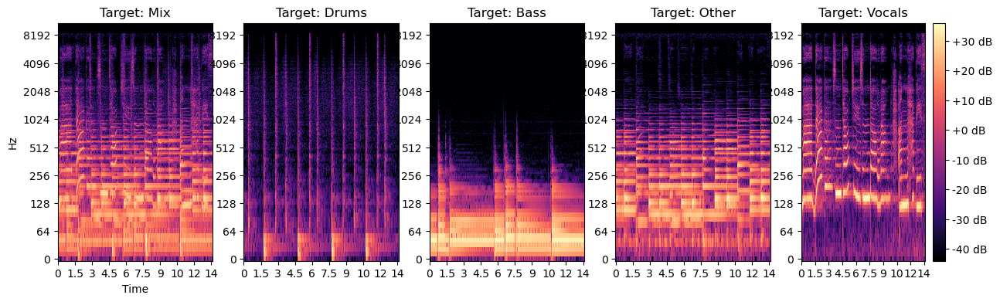

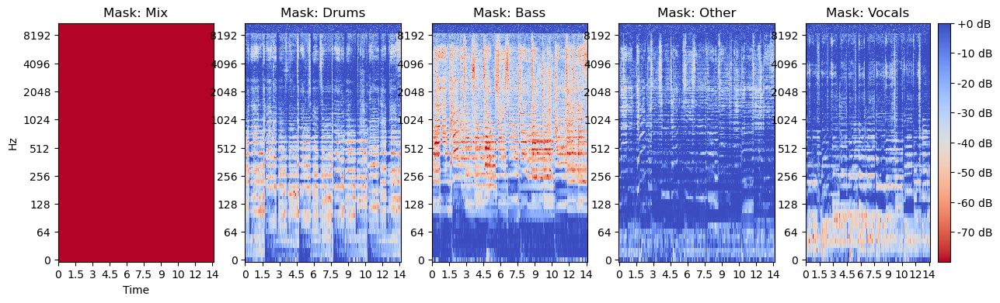

In [17]:
spec_data, masks = make_masks(stems)

Interpretting these masks can be a bit challenging as its hard to make out what is exactly what is going on in these spectrograms. I think to understand them the best one is to look at is the bass spectrograms. In the target, we can see all the sound is coming from the low frequencies which is to be expected from the bass. 

Then for mask spectrograms its best to see them as a weight matrix with only neutral or negative weights. Remember these are always applied to the mix spectrogram shown at the top left corner. Blue means the values aren't affected and red means the values are negatively weighted. So the bass mask will mostly remove audio signals that correlate to high frequencies while preserving most of the low frequencies. 

### Mathematical Understanding

I think to understand the masks a little more it can help to remind yourself how these are being calculated. The masks themselves are made using the target spectrograms themselves, which is typically impsossible, but for the sake of demonstration is okay. They are calculated using a simple nonlinear formula where the weight is equal to the percentage the target makes up of the overall mix signal. 

$$m_i = \frac{s_i}{max(s, s_i)}, s=\text{Mix STFT Representation}, s_i=\text{Target STFT Representation}$$

So if the target signal is more prevalent at the frequency than the mix is, the mask does not affect that frequency. If the mix is more prevalent though, then the mix is just multiplied by the fraction the target makes up of that frequency. You may also be confused by the appearance of negative decibels in the colorbar. Generally negative decibels are sounds with magnitudes below the human ability to perceive them, but in this case, it can actually very eloquently explain what the mask does to an extent. Human beings hear on a $log_{10}$ scale which is what decibels represent, i.e. if a sound has time times more magnitude we hear it as just twice as loud. And a nice property of logs you may remember is:

$$log(a/b) = log(a)-log(b)$$

Which is exactly what we are doing in these representations. We are dividing the target source by the overall mix, so the masks are essentially just subtracting the right amount of decibels from the mix itself.

In [18]:
def apply_masks(spec_data, masks):
    """ 
    Applies generated masks, to given spectrogram mix and displays the.

    Args: 
        spec_data: (list) list of spectral data.
        masks: (list) list of masks.
    Returns:
        est_sources: (list) list of applied masks to spectral mix.
    """
    fig1, axes1 = plt.subplots(1,4, figsize=(12,4))
    fig2, axes2 = plt.subplots(1,4, figsize=(12,4))
    sources = ['Mix','Drums','Bass','Other','Vocals']
    est_sources = []
    for i in range(0,4):
        est_source = spec_data[0][2] * masks[i+1]
        est_sources.append(est_source)
        img1=librosa.display.specshow(librosa.amplitude_to_db(spec_data[i+1][1]), y_axis='log', x_axis='time',cmap='magma', ax=axes1[i]) # Plots spectrograms
        img2=librosa.display.specshow(librosa.amplitude_to_db(np.abs(est_source)), y_axis='log', x_axis='time',cmap='magma', ax=axes2[i])
        axes1[i].set_title(f'Target: {sources[i+1]}')
        axes2[i].set_title(f'Estimated source: {sources[i+1]}')
        axes1[i].set_xlabel('') # Removes labels for visual clarity
        axes1[i].set_ylabel('')
        axes2[i].set_xlabel('')
        axes2[i].set_ylabel('')

    fig1.colorbar(img1, format="%+2.0f dB")
    fig2.colorbar(img2, format="%+2.0f dB")

    return est_sources
    

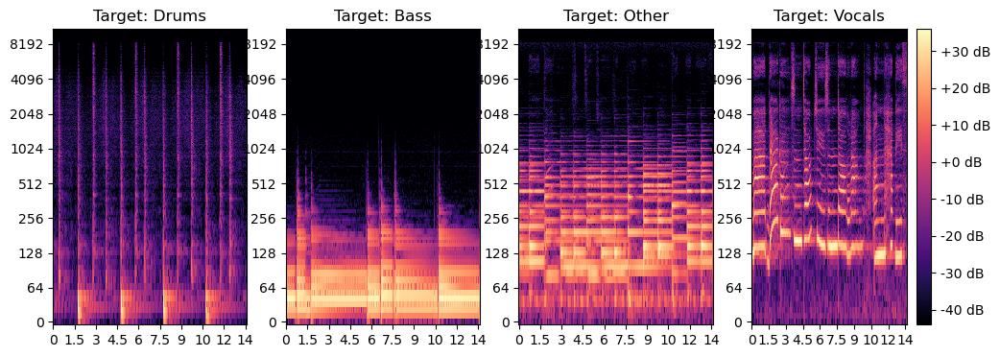

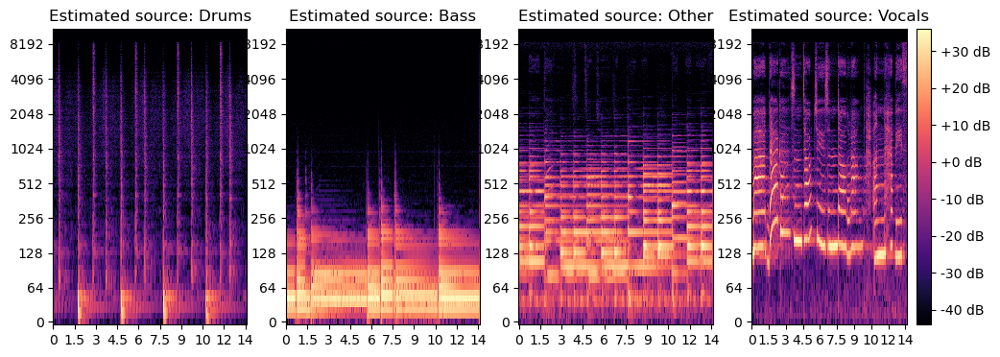

In [19]:
s_hat = apply_masks(spec_data, masks)

Looks pretty good! Almost identical, however if we graph the residuals hopefully the differences will become a little more apparent.

In [20]:
def plot_residuals_spec(spec_data, s_hat):
    """ 
    Measures and plots residuals on spectrograms.
    Args:
        spec_data (list) list of spectral data
    Returns:
        s_hat (list) list of source estimations.
    """
    fig, axes = plt.subplots(1,4, figsize=(12,4))
    residuals = []
    sources = ['Drums','Bass','Other','Vocals']

    for i in range(4):
        res = (spec_data[i+1][1] - np.abs(s_hat[i]))**2 # performs residual calculation
        residuals.append(res)
        img = librosa.display.specshow(res, y_axis='log', x_axis='time',cmap='RdYlBu_r', ax=axes[i])
        axes[i].set_title(f'Residuals: {sources[i]}')
        axes[i].set_xlabel('')
        axes[i].set_ylabel('')
    
    # Creates custom ticks
    cbar = fig.colorbar(img, ax=axes, orientation='horizontal', spacing='uniform')
    cbar_ticks = [np.min(res),np.max(res)]
    cbar.set_ticks(cbar_ticks)

    # Custom tick labels
    labels = ["No Difference", "Large Difference"]
    cbar.set_ticklabels(labels)

    return residuals


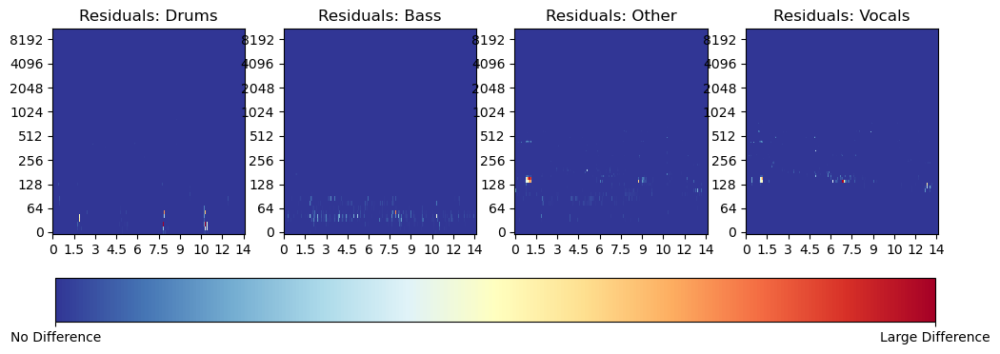

In [21]:
residuals = plot_residuals_spec(spec_data, s_hat)

Looking at this the differences are much more apparent. There are a couple of things to note. 

- The errors generally seem very sporadic and almost random.
- The errors do appear to possibly happen more often in very contested frequency/time ranges. 

In [22]:
def playback_sources(spec_data, s_hat):

    est_signal = [librosa.istft(est_source) for est_source in s_hat]
    true_signal = [librosa.istft(spec_data[i][2]) for i in range(1,5)]

    sources = ['Drums','Bass','Other','Vocals']

    for i in range(4):
        print('True Signal:', sources[i])
        ipd.display(ipd.Audio(true_signal[i], rate=sr))
        print('Estimated Signal:', sources[i])
        ipd.display(ipd.Audio(est_signal[i], rate=sr))
        print()
    
    return est_signal


In [23]:
est_signals = playback_sources(spec_data, s_hat)

True Signal: Drums


Estimated Signal: Drums



True Signal: Bass


Estimated Signal: Bass



True Signal: Other


Estimated Signal: Other



True Signal: Vocals


Estimated Signal: Vocals


Listening to the generated sources, they are nearly identical to the exact sources. But there are little bits of distortion and artifacts within the new signals, they can be hard to hear, the one that is the most easily perceptible is the vocals as our ears are more sensitive to changes in peoples voices than in instrument sounds. Most likely these are the little bits of noise that we found in the residual analysis. 

So, where are these pieces of noise coming from exactly? These estimations should have little to no error, as they are generated using the actual source signals themselves. I'll try to answer this question in the next sections.

## Quantatative Analysis

There are a few ways to look at residuals mathematically that we learned in class and that people frequently use in signal processing. 

### MSE and RMSE (Mean Squared Error and Root Mean Squared Error)

The MSE also called the L2 norm is maybe one of the most commonly used error/loss functions used in statistics. Nonetheless it's a good idea to examine the statistic to get a better understanding of the residuals. For this task the MSE would be in the form:

$$\text{MSE or }L2_{time} = \frac{1}{KT}\sum_{t,k}|\hat{y}_{t,k} - y_{t,k}|^2$$

$$L1_{time} = \frac{1}{KT}\sum_{t,k}|\hat{y}_{t,k} - y_{t,k}|$$

Many modules will have this function built into to calculate MSE or L1 norms.

In [25]:
def calc_norms(residuals):
    """ 
    Calculates and returns the l1 and l2 norms of the residual function for each taret source. Also prints values to display.
    Args:
        residuals (list) list of residual values of each source
    Returns:
        l1 (list) list of mean values of each sources' residuals
        l2 (list) list of mean squared values of each sources' residuals
    """
    sources = ['Drums','Bass','Other','Vocals']
    MSE = []
    me = []
    for i, res in enumerate(residuals):
        norm = np.mean(np.abs(res))
        MSE.append(norm)
        mse = np.mean(np.abs(res)**2)
        me.append(mse)

        print(f'{sources[i]}: MSE={mse}, l1={norm}')

    return MSE, me


In [26]:
mse, me = calc_norms(residuals)

Drums: MSE=0.5959536455527268, l1=0.0062479097215038405
Bass: MSE=1.888864038144685, l1=0.02271881830079313
Other: MSE=20.93667357163523, l1=0.06872135294090631
Vocals: MSE=4.975712613301147, l1=0.03381356376505182


### SDR, SNR, SIR, and SAR (Signal to Distortion, Noise, Interference, and Artifacts Ratio)

These are statistics used in music source separation but also in many other different applications of signal processing. With these terms it probably best to introduce a few terms of error in music source separation.

- *Noise*: Also called white noise, noise is a feeding of random independently generated values or just adding other signals onto a signal, at a regular interval and with constant variance and mean. Noise will typically be a feature of any real world distribution, and typically represents random variation in a distribution over time.

- You can simulate noise in an audio signal very easily by adding a term to the signal data itself.

In [27]:
print("Normal Signal")
ipd.display(ipd.Audio((stems[0]), rate=sr))
print("Signal w/ added white noise")
white_noise = np.random.normal(0,0.05,size=len(stems[0]))
ipd.display(ipd.Audio((stems[0] + white_noise), rate=sr))

Normal Signal


Signal w/ added white noise


- *Interference*: In music source separation, interference refers to the amount of other non-desired sources that appear in estimated source. So for example if you heard the drums in the estimation for the bass source, that would be interference.

- You can simulate noise this by simply adding a bit of one sources' audio to another.

In [28]:
print("Bass Signal")
ipd.display(ipd.Audio((stems[2]), rate=sr))
interference = stems[2] + (stems[1]*white_noise) # Adding the drums to the bass track at a random proportion of white noise.
print("Signal w/ interference")
ipd.display(ipd.Audio(interference, rate=sr))

Bass Signal


Signal w/ interference


- *Artifacts*: Unwanted alteration in an audio signal, these will typically arise from compression, transmission errors, or sloppy processing mistakes.  

- One type of artifacts you can simulate is clipping, where the amplitutde of an audio exceeds the maximum value that the system can record.

In [29]:
print("Normal Signal")
ipd.display(ipd.Audio((stems[0]), rate=sr))
clipped = np.clip(stems[0], -0.25, 0.25) 
print("Clipped Signal")
ipd.display(ipd.Audio(clipped, rate=sr))

Normal Signal


Clipped Signal


- *Distortion*: An overall measure of the prescence of these 3 unwanted effects in a digital audio signal.

We then use these error terms to come up with this interpretation of our estimated sources.

$$\hat{s_j} = s_{\text{target}} + e_{\text{interf}} + e_{\text{noise}} + e_{\text{artif}}$$

Where $\hat{s_j}$ is our estimated source for source $j$, $s_{\text{target}}$ is our true source audio w/ allowed distortion*, $e_{\text{interf}}, e_{\text{noise}}, e_{\text{artif}}$ are the error terms for interference, noise and artifacts respectively.

*When I say allowed distortion essentially it just covers any difference in the estimated source that is not covered by these three error terms.

To calculate these terms we use these formulas:

Let $\Pi\{y_1,...,y_k\}$ denote a orthogonal projector onto the subspace spanned by $y_1,..,y_k$.

$$P_{s_j} = \Pi \{ s_j \}$$
$$ P_{s} = \Pi \{ s_{j\prime} \} , \text{where } j\neq j\prime $$
$$ P_{s,n} = \Pi \{ s_{j\prime} \} , (n_i)_{1\le n \le m}, \text{where } n_i\text{ is noise from ith microphone} $$ 

And remember:
$$\Pi \{ s_j \}y_k = \frac{ \langle s_j,y_k \rangle y_k}{\langle s_j,s_j \rangle} $$

Then use these for:

$$s_{\text{target}} = P_{s_j}\hat s_j$$

$$e_{\text{interf}} = P_{s}\hat s_j - P_{s_j}\hat s_j$$

$$e_{\text{noise}} = P_{s,n}\hat s_j - P_{s}\hat s_j$$

$$e_{\text{artif}} = \hat s_j - P_{s,n}\hat s_j$$

$$\text{So: } \hat s_j = (P_{s_j}\hat s_j) + (P_{s}\hat s_j - P_{s_j}\hat s_j) + (P_{s,n}\hat s_j - P_{s}\hat s_j) + (\hat s_j - P_{s,n}\hat s_j)$$

Finally the metrics are calculated with:

$$SDR = 10log_{10}\frac{||s_{\text{target}}||^2}{||e_{\text{interf}} + e_{\text{noise}} + e_{\text{artif}}||^2}$$

$$SIR = 10log_{10}\frac{||s_{\text{target}}||^2}{||e_{\text{interf}}}$$

$$SNR = 10log_{10}\frac{||s_{\text{target}} + e_{\text{interf}}||^2}{||e_{\text{noise}}||^2}$$

$$SAR = 10log_{10}\frac{||s_{\text{target}} + e_{\text{noise}} + e_{\text{interf}}||^2}{||e_{\text{artif}}||^2}$$

Note: This can get somewhat confusing as SNR is also a commonly used metric in signal processing, however this version is different than the normal kind. The normal SNR is calculated with:

$$SNR = 10log_{10}\frac{||s_{j}||^2}{||\hat s_{j} - s_{j}||^2}$$

In [30]:
def calc_evals(estimate, references, idx, calc_sirsar=True):
    """ 
    Calculates evaluation metrics using implementations detailed in https://arxiv.org/pdf/1811.02508.
    Only calculates using mono channel audio.
    Args: 
        estimate: (np.array) Audio signal data of estimated source. In shape: (T, ) 
        references: (np.array) Source audio signal data in shape: (T, C)
        idx: (int) Index of target source within references matrix
        calc_sirsar: (bool) Determines if SAR and SIR are calculated as in some cases it may be unnecessary

    Returns:
        SI-SDR: Scale-invariant source-to-distortion ratio. Higher is better.
        SI-SIR: Scale-invariant source-to-interference ratio. Higher is better.
        SI-SAR: Scale-invariant source-to-artifact ratio. Higher is better.
        SD-SDR: Scale-dependent source-to-distortion ratio. Higher is better.
        SNR: Signal-to-noise ratio. Higher is better.
        SRR: The source-to-rescaled-source ratio. This corresponds to 
      a term that punishes the estimate if its scale is off relative
      to the reference. This is an unnumbered equation in [1], but
      is the term on page 2, second column, second to last line:
      ||s - alpha*s||**2. s here is factored out. Higher is better.

    """
    source = references[...,idx]
    source_energy = (source**2).sum()
    alpha = (source @ estimate) / source_energy

    e_true = source
    e_res = estimate - e_true

    signal = (e_true**2).sum()
    noise = (e_res**2).sum()

    snr = 10 * np.log10(signal / noise)

    e_true = source * alpha
    e_res = estimate - e_true

    signal = (e_true**2).sum()
    noise = (e_res**2).sum()

    si_sdr = 10 * np.log10(signal / noise)
    srr = -10 * np.log10((1 - (1/alpha)) ** 2)
    sd_sdr = snr + np.log10(alpha**2)

    si_sir = np.nan
    si_sar = np.nan

    if calc_sirsar:
        references_projection = references.T@references
        references_onto_res = np.dot(references.T, e_res)

        b = np.linalg.solve(references_projection, references_onto_res)

        e_interf = np.dot(references, b)
        e_artif = e_res - e_interf

        si_sir = 10 * np.log10(signal / (e_interf**2).sum())
        si_sar = 10 * np.log10(signal / (e_artif**2).sum())
    
    return si_sdr, si_sir, si_sar, sd_sdr, snr, srr



In [42]:
references = np.array(stems[1:]).T
estimate = est_signals[1]

source = references[...,1]
source_energy = (source**2).sum()
alpha = (source @ estimate) / source_energy

In [45]:
e_true = source
e_res = estimate - e_true

signal = (e_true**2).sum()
noise = (e_res**2).sum()

snr = 10 * np.log10(signal / noise)

In [50]:
import numpy as np

def normalize_array(arr):
    mean = np.mean(arr)
    std = np.std(arr)
    normalized_arr = (arr - mean) / std
    return normalized_arr

# Example usage:
arr = np.array([1, 2, 3, 4, 5])
normalized_arr = normalize_array(arr)
print(normalized_arr)

[-1.41421356 -0.70710678  0.          0.70710678  1.41421356]


In [38]:
import pandas as pd 

references = np.array(stems[1:]).T
drums_eval, bass_eval, other_eval, vocals_eval = [calc_evals(est_signals[i], references, i) for i in range(4)]

metrics = pd.DataFrame(data = [drums_eval, bass_eval, other_eval, vocals_eval], 
                       columns=["SISDR", "SISIR", "SISAR", 'SDSDR', "SNR", "SRR"],
                       index = ["Drums", "Bass", "Other", "Vocals"]
                       )

# Calculating the mean of each column
mean_row = metrics.mean()

# Converting the mean series to a DataFrame
mean_df = pd.DataFrame(mean_row).T

# Assigning a label for the index of the mean row
mean_df.index = ['Total Score']

# Appending the mean row to the original DataFrame
metrics = pd.concat([metrics, mean_df])

metrics

,SISDR,SISIR,SISAR,SDSDR,SNR,SRR
Drums,6.092856,12.527783,7.212475,6.856088,7.005570,14.526412
Bass,6.967354,12.419686,8.423983,7.612164,7.756829,14.835652
Other,9.726310,13.702139,11.947180,10.070688,10.164172,18.889882
Vocals,8.585456,14.887381,9.744978,9.042042,9.143592,18.130056
Total Score,7.842994,13.384247,9.332154,8.395246,8.517541,16.595501


For reference a very good score for a Music Source Separator for SDR is about 6. However the most state-of-the-art MSS's have reported SDR scores of up to 9.20! 

### Correlation Errors

Analyze the correlation between the residuals and the target source. High correlation in specific regions might indicate systematic errors in your model.

### Temporal Patterns 

Check if there are temporal patterns in the residuals that could indicate specific time-based issues in your separation model, such as lag or phase issues.